# Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[art]
exit()
```

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("INFO")
eKonf.set_cuda(device="4,5")
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive(
        workspace="MyDrive/colab_workspace", project="disco-imagen"
    )

print("environment variables:")
eKonf.print(eKonf.env().dict())

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:4)', 'A100-SXM4-40GB (id:5)']
INFO:ekorpkit.utils.notebook:shell type: ZMQInteractiveShell
INFO:ekorpkit.utils.notebook:Google Colab not detected.


version: 0.1.40
is notebook? True
is colab? False
environment variables:
{'CUDA_DEVICE_ORDER': 'PCI_BUS_ID',
 'CUDA_VISIBLE_DEVICES': '4, 5',
 'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': 'INFO',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_WORKSPACE_ROOT': '/workspace',
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'NUM_WORKERS': 230}


## Create a stable diffusion instance

In [2]:
cfg = eKonf.compose("model/stable_diffusion")
sd = eKonf.instantiate(cfg)

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.utils.notebook:shell type: ZMQInteractiveShell
INFO:ekorpkit.base:setting environment variable CACHED_PATH_CACHE_ROOT to /workspace/.cache/cached_path
INFO:ekorpkit.base:setting environment variable KMP_DUPLICATE_LIB_OK to TRUE
INFO:absl:Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO:absl:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: Interpreter CUDA Host
INFO:absl:Unable to initialize backend 'tpu': module 'jaxlib.xla_extension' has no attribute 'get_tpu_client'
INFO:ekorpkit.models.art.base:> downloading models...
INFO:ekorpkit.models.art.base:> loading modules...
INFO:ekorpkit.models.art.base:No modules to load
INFO:ekorpkit.models.art.base:> loading models...


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

## Generate images

In [3]:
text_prompts = "a living tiger inside a gorgeous cave in a futuristic Jeju island"
batch_name = "cave-jeju"

INFO:ekorpkit.models.art.base:Merging config with args: {}
INFO:ekorpkit.models.art.base:Prompt: None


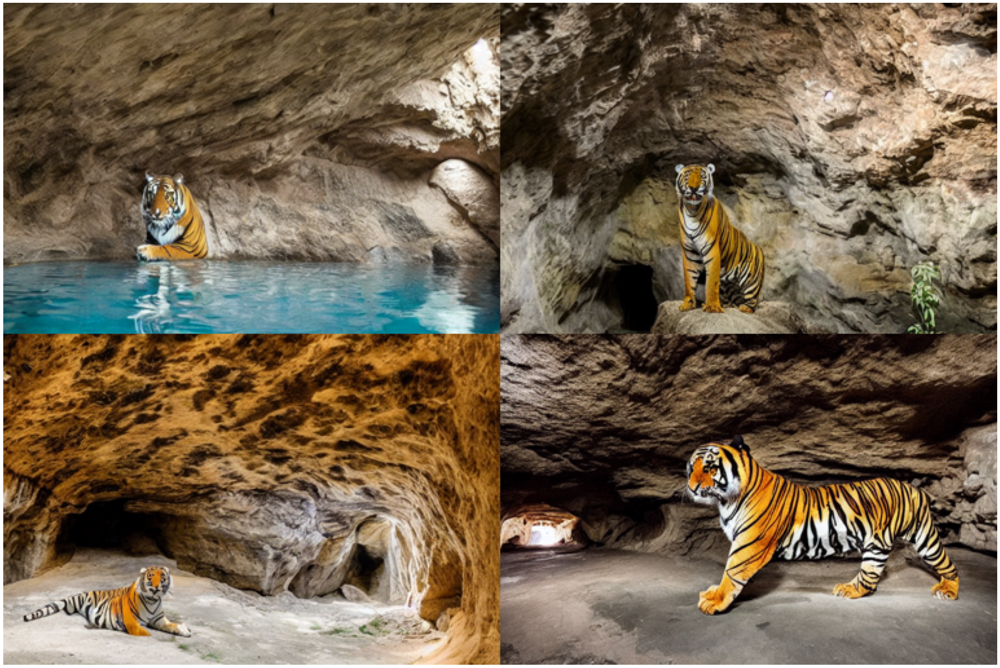

In [4]:
sd.imagine(
    text_prompts, 
    batch_name=batch_name, 
    n_samples=4, 
    show_collage=True,
    guidance_scale=2
)

## Inpainting

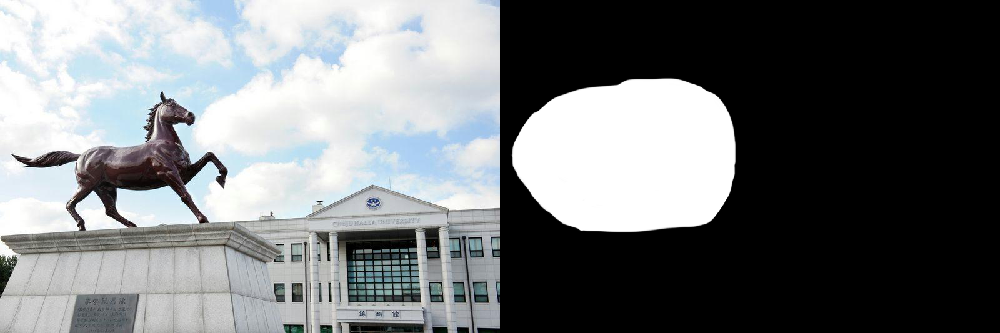

In [15]:
init_image = eKonf.load_image("https://github.com/entelecheia/ekorpkit-book/raw/main/assets/figs/chu-horse.png")
mask_image = eKonf.load_image("https://github.com/entelecheia/ekorpkit-book/raw/main/assets/figs/chu-horse-masking.png")

sd.compare_images([original, masking])

In [26]:
prompt = "a golden statue of a eagle"

images = sd.inpainting(
    prompt, 
    original, 
    masking, 
    num_images_per_prompt=3, 
    guidance_scale=3, 
    num_inference_steps=50,
    return_including_init_image=True
)

  0%|          | 0/50 [00:00<?, ?it/s]

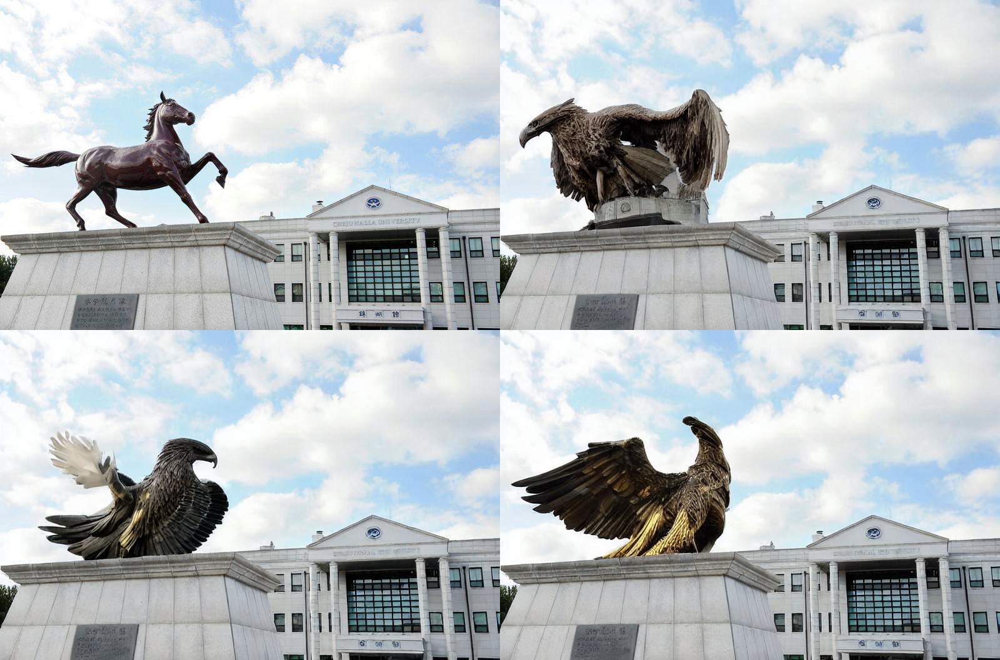

In [27]:
sd.compare_images(images, rows=2)

## Show config

In [31]:
sd.show_config(batch_name=batch_name, batch_num=0)

INFO:ekorpkit.models.art.base:Merging config with args: {}


{'base_height': 512,
 'base_width': 768,
 'batch_name': 'cave-jeju',
 'batch_num': 0,
 'guidance_scale': 0.75,
 'inpaint_strength': 0.75,
 'n_samples': 6,
 'num_images_per_prompt': 1,
 'num_steps': 100,
 'resume_run': False,
 'run_to_resume': 'latest',
 'seed': 3602506352,
 'set_seed': 'random_seed',
 'text_prompts': None}
